 #  Multiple cancer classification and analysis 📊

In [15]:
import tensorflow as tf
from tensorflow import keras
from keras import layers, optimizers, losses
from keras.applications import MobileNetV3Large
from keras.applications.mobilenet_v3 import preprocess_input
from keras.preprocessing import image_dataset_from_directory, image
import numpy as np
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Loadig the dataset and deviding it into testset and validation set 💻

In [16]:
BATCH = 16
SIZE = (224,224)

directory = "/kaggle/input/multi-cancer/Multi Cancer/Multi Cancer"

def data_loading(types, subset):
    print(f"{types}'s {subset} dataset")
    directory1 = directory + "/" + types
    dataset = image_dataset_from_directory(
        directory1,
        labels = "inferred",
        label_mode = "categorical",
        validation_split = 0.2,
        subset = subset,
        shuffle = True,
        seed = 123,
        batch_size = BATCH,
        image_size = SIZE,
    )
    return dataset

brain_dataset_train = data_loading("Brain Cancer", "training")
brain_dataset_val = data_loading("Brain Cancer", "validation")
breast_dataset_train = data_loading("Breast Cancer", "training")
breast_dataset_val = data_loading("Breast Cancer", "validation")
cervical_dataset_train = data_loading("Cervical Cancer", "training")
cervical_dataset_val = data_loading("Cervical Cancer", "validation")
kidney_dataset_train = data_loading("Kidney Cancer", "training")
kidney_dataset_val = data_loading("Kidney Cancer", "validation")
colon_dataset_train = data_loading("Lung and Colon Cancer", "training")
colon_dataset_val = data_loading("Lung and Colon Cancer", "validation")
lymphoma_dataset_train = data_loading("Lymphoma", "training")
lymphoma_dataset_val = data_loading("Lymphoma", "validation")
oral_dataset_train = data_loading("Oral Cancer", "training")
oral_dataset_val = data_loading("Oral Cancer", "validation")

Brain Cancer's training dataset
Found 15000 files belonging to 3 classes.
Using 12000 files for training.
Brain Cancer's validation dataset
Found 15000 files belonging to 3 classes.
Using 3000 files for validation.
Breast Cancer's training dataset
Found 10000 files belonging to 2 classes.
Using 8000 files for training.
Breast Cancer's validation dataset
Found 10000 files belonging to 2 classes.
Using 2000 files for validation.
Cervical Cancer's training dataset
Found 25000 files belonging to 5 classes.
Using 20000 files for training.
Cervical Cancer's validation dataset
Found 25000 files belonging to 5 classes.
Using 5000 files for validation.
Kidney Cancer's training dataset
Found 10000 files belonging to 2 classes.
Using 8000 files for training.
Kidney Cancer's validation dataset
Found 10000 files belonging to 2 classes.
Using 2000 files for validation.
Lung and Colon Cancer's training dataset
Found 25000 files belonging to 5 classes.
Using 20000 files for training.
Lung and Colon Ca

In [17]:
import tensorflow as tf
import os

def filtered_data_loading(exclude_type, subset):
    print(f"Loading multi-cancer dataset excluding {exclude_type}")
    full_dir = "/kaggle/input/multi-cancer/Multi Cancer/Multi Cancer"
    class_dirs = [
        d for d in os.listdir(full_dir)
        if os.path.isdir(os.path.join(full_dir, d)) and d != exclude_type
    ]
    temp_dir = "/kaggle/working/filtered_data"

    # Create symlinked structure
    if not os.path.exists(temp_dir):
        os.makedirs(temp_dir)
        for d in class_dirs:
            os.symlink(os.path.join(full_dir, d), os.path.join(temp_dir, d))

    return tf.keras.preprocessing.image_dataset_from_directory(
        temp_dir,
        labels="inferred",
        label_mode="categorical",
        validation_split=0.2,
        subset=subset,
        seed=123,
        shuffle=True,
        batch_size=16,
        image_size=(224, 224)
    )

main_dataset_train = filtered_data_loading("ALL", "training")
main_dataset_val = filtered_data_loading("ALL", "validation")

Loading multi-cancer dataset excluding ALL
Found 110002 files belonging to 7 classes.
Using 88002 files for training.
Loading multi-cancer dataset excluding ALL
Found 110002 files belonging to 7 classes.
Using 22000 files for validation.


In [18]:
main_dataset_train.class_names

['Brain Cancer',
 'Breast Cancer',
 'Cervical Cancer',
 'Kidney Cancer',
 'Lung and Colon Cancer',
 'Lymphoma',
 'Oral Cancer']

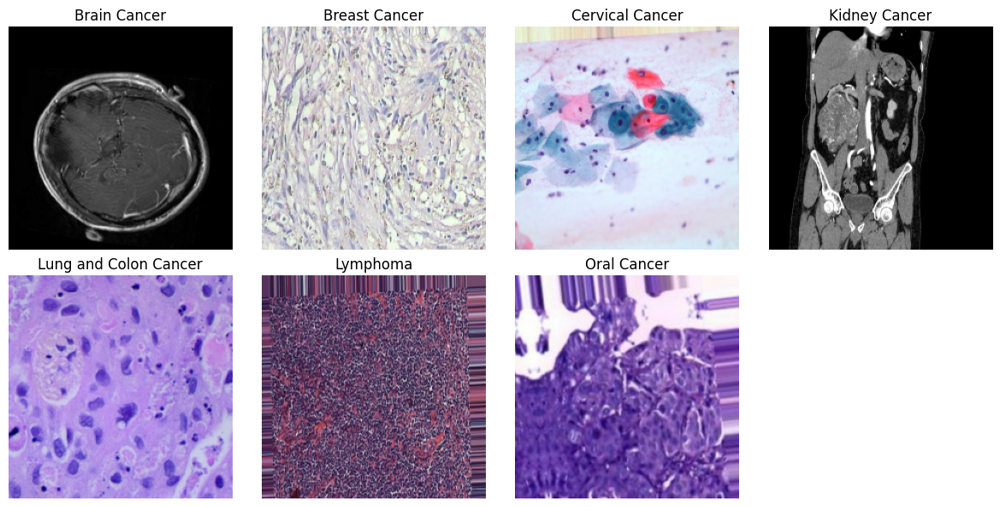

In [19]:
import matplotlib.pyplot as plt
import numpy as np
import math

# your class names
class_names = main_dataset_train.class_names

# prepare a dict to hold one example image per class
rep_images = {cls: None for cls in class_names}

# iterate until you’ve seen one image of each class
for batch in main_dataset_train.unbatch().batch(1):
    img, label = batch
    idx = np.argmax(label.numpy())
    cls = class_names[idx]
    if rep_images[cls] is None:
        rep_images[cls] = img[0].numpy().astype("uint8")
    if all(v is not None for v in rep_images.values()):
        break

n = len(class_names)
cols = 4
rows = math.ceil(n / cols)

plt.figure(figsize=(cols * 3, rows * 3))
for i, cls in enumerate(class_names):
    ax = plt.subplot(rows, cols, i + 1)
    ax.imshow(rep_images[cls])
    ax.set_title(cls)
    ax.axis("off")

plt.tight_layout()
plt.show()

In [20]:
import os

root_path = "/kaggle/input/multi-cancer/Multi Cancer/Multi Cancer"

def list_subtypes(cancer_type):
    path = os.path.join(root_path, cancer_type)
    if os.path.exists(path):
        subtypes = sorted(os.listdir(path))
        print(f"{cancer_type} subtypes: {subtypes}")
    else:
        print(f"{cancer_type} folder not found.")

# Example usage
list_subtypes("Brain Cancer")
list_subtypes("Breast Cancer")
list_subtypes("Cervical Cancer")
list_subtypes("Lung and Colon Cancer")
list_subtypes("Lymphoma")
list_subtypes("Kidney Cancer")
list_subtypes("Oral Cancer")


Brain Cancer subtypes: ['brain_glioma', 'brain_menin', 'brain_tumor']
Breast Cancer subtypes: ['breast_benign', 'breast_malignant']
Cervical Cancer subtypes: ['cervix_dyk', 'cervix_koc', 'cervix_mep', 'cervix_pab', 'cervix_sfi']
Lung and Colon Cancer subtypes: ['colon_aca', 'colon_bnt', 'lung_aca', 'lung_bnt', 'lung_scc']
Lymphoma subtypes: ['lymph_cll', 'lymph_fl', 'lymph_mcl']
Kidney Cancer subtypes: ['kidney_normal', 'kidney_tumor']
Oral Cancer subtypes: ['oral_normal', 'oral_scc']


In [21]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def show_sample_images(cancer_type, n=3):
    path = os.path.join(root_path, cancer_type)
    subtypes = os.listdir(path)
    
    for subtype in subtypes:
        subtype_path = os.path.join(path, subtype)
        images = os.listdir(subtype_path)[:n]
        print(f"{subtype} sample images:")
        plt.figure(figsize=(10, 2))
        for i, img_name in enumerate(images):
            img_path = os.path.join(subtype_path, img_name)
            img = mpimg.imread(img_path)
            plt.subplot(1, n, i + 1)
            plt.imshow(img)
            plt.title(subtype)
            plt.axis("off")
        plt.show()

brain_tumor sample images:


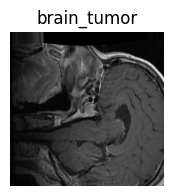

brain_glioma sample images:


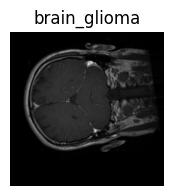

brain_menin sample images:


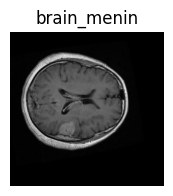

In [22]:
import os
root_path = "/kaggle/input/multi-cancer/Multi Cancer/Multi Cancer"  # Define if not already
show_sample_images("Brain Cancer", n=1)

breast_benign sample images:


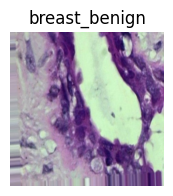

breast_malignant sample images:


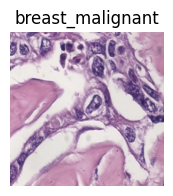

In [23]:
import os
root_path = "/kaggle/input/multi-cancer/Multi Cancer/Multi Cancer"  # Define if not already
show_sample_images("Breast Cancer", n=1)

cervix_koc sample images:


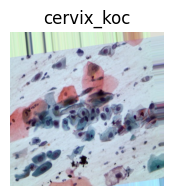

cervix_dyk sample images:


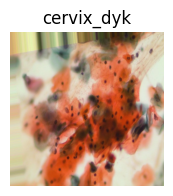

cervix_pab sample images:


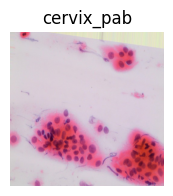

cervix_sfi sample images:


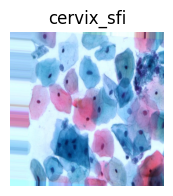

cervix_mep sample images:


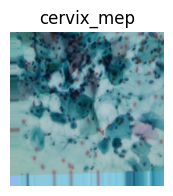

In [24]:
import os
root_path = "/kaggle/input/multi-cancer/Multi Cancer/Multi Cancer"  # Define if not already
show_sample_images("Cervical Cancer", n=1)

oral_scc sample images:


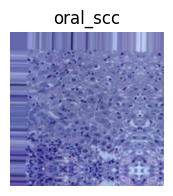

oral_normal sample images:


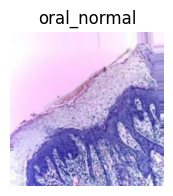

In [25]:
import os
root_path = "/kaggle/input/multi-cancer/Multi Cancer/Multi Cancer"  # Define if not already
show_sample_images("Oral Cancer", n=1)

kidney_tumor sample images:


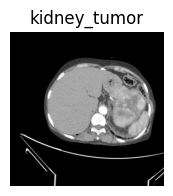

kidney_normal sample images:


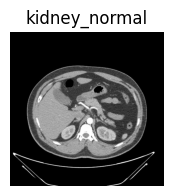

In [26]:
import os
root_path = "/kaggle/input/multi-cancer/Multi Cancer/Multi Cancer"  # Define if not already
show_sample_images("Kidney Cancer", n=1)

lymph_fl sample images:


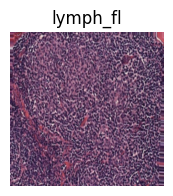

lymph_cll sample images:


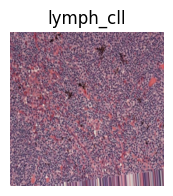

lymph_mcl sample images:


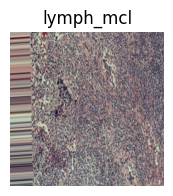

In [27]:
import os
root_path = "/kaggle/input/multi-cancer/Multi Cancer/Multi Cancer"  # Define if not already
show_sample_images("Lymphoma", n=1)

colon_bnt sample images:


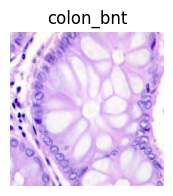

colon_aca sample images:


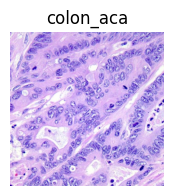

lung_aca sample images:


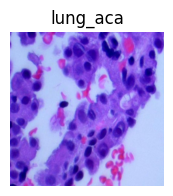

lung_bnt sample images:


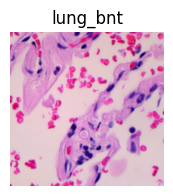

lung_scc sample images:


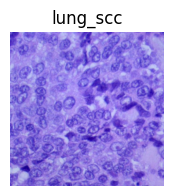

In [28]:
import os
root_path = "/kaggle/input/multi-cancer/Multi Cancer/Multi Cancer"  # Define if not already
show_sample_images("Lung and Colon Cancer", n=1)

# the pre-trained MobileNetV3 model

In [29]:
from tensorflow.keras.applications import MobileNetV3Large
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam

def create_model(num_classes):
    # Load the pre-trained MobileNetV3 model
    pre_model = MobileNetV3Large(
        weights='/kaggle/input/model/keras/default/1/weights_mobilenet_v3_large_224_1.0_float_no_top_v2.h5',
        include_top=False,
        input_shape=(224, 224, 3)
    )
    
    # Freeze the base model layers to use transfer learning
    pre_model.trainable = False
    
    # Add custom classification layers
    x = pre_model.output
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dense(1024, activation='relu')(x)
    x = layers.Dense(512, activation='relu')(x)
    x = layers.Dense(128, activation='relu')(x)
    output_layer = layers.Dense(num_classes, activation='softmax')(x)
    
    # Create the final model
    model = models.Model(inputs=pre_model.input, outputs=output_layer)
    
    # Compile the model
    model.compile(
        loss='categorical_crossentropy',
        optimizer=Adam(learning_rate=0.0001),
        metrics=['accuracy']
    )
    
    return model

In [30]:
def train_model(train_data, val_data, num_classes, model_name):
    model = create_model(num_classes)
    history = model.fit(train_data, validation_data=val_data, epochs=10)  # Store history
    model.save(f"{model_name}_model.h5")
    return history, model  # Return both history and model

In [31]:
def train_model_oral(train_data, val_data, num_classes, model_name):
    model = create_model(num_classes)
    history = model.fit(train_data, validation_data=val_data, epochs=15)  # Store history
    model.save(f"{model_name}_model.h5")
    return history, model  # Return both history and model

# distribution plot

In [32]:
import matplotlib.pyplot as plt

def plot_class_distribution(dataset, title):
    class_counts = {}
    class_names = dataset.class_names  # Get class labels
    for images, labels in dataset:
        for label in labels.numpy():
            class_index = label.argmax()
            class_counts[class_names[class_index]] = class_counts.get(class_names[class_index], 0) + 1

    plt.figure(figsize=(8, 5))
    plt.bar(class_counts.keys(), class_counts.values(), color='skyblue')
    plt.xlabel("Classes")
    plt.ylabel("Count")
    plt.title(title)
    plt.xticks(rotation=45)
    plt.show()


# Training hsitory and accuracy plot

In [33]:
def plot_training_history(history):
    plt.figure(figsize=(12, 5))

    # Accuracy Plot
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.title("Model Accuracy")

    # Loss Plot
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.title("Model Loss")

    plt.show()


# confusion matrix

In [34]:
import numpy as np
import tensorflow as tf
import seaborn as sns
from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(model, dataset, class_names):
    y_true = []
    y_pred = []

    for images, labels in dataset:
        predictions = model.predict(images)
        y_pred.extend(np.argmax(predictions, axis=1))
        y_true.extend(np.argmax(labels.numpy(), axis=1))

    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title("Confusion Matrix")
    plt.show()

# Sample Prediction Plotting 

In [35]:
import random

def plot_sample_predictions(model, dataset, class_names):
    images, labels = next(iter(dataset))
    predictions = model.predict(images)

    num_images = images.shape[0]
    plt.figure(figsize=(10, 10))
    for i in range(min(9, num_images)):  # Show up to 9 images, but not more than available
        plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        pred_label = class_names[np.argmax(predictions[i])]
        true_label = class_names[np.argmax(labels[i].numpy())]
        plt.title(f"Pred: {pred_label}\nTrue: {true_label}", color="green" if pred_label == true_label else "red")
        plt.axis("off")
plt.show()



#  generate_gradcam_heatmap function

In [36]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2

def generate_gradcam_heatmap(model, image, class_index, last_conv_layer_name="conv_1"):
    """
    Generate and display a Grad-CAM heatmap for a given image and class index.

    Args:
        model: Trained Keras model.
        image: Input image (preprocessed, shape=(1, height, width, channels)).
        class_index: Index of the target class (e.g., cancer type).
        last_conv_layer_name: Name of the last convolutional layer (default: "conv_1").
    """
    # Create a model that outputs the last conv layer and predictions
    grad_model = tf.keras.models.Model(
        [model.inputs],
        [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(image)
        loss = predictions[:, class_index]

    # Gradient of loss w.r.t. conv layer output
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap + 1e-10)  # avoid div by zero
    heatmap = heatmap.numpy()

    # Resize heatmap to match input image size
    heatmap_resized = cv2.resize(heatmap, (image.shape[2], image.shape[1]))
    heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)

    # Prepare original image for overlay
    img_display = image[0].numpy()
    if np.max(img_display) <= 1.0:
        img_display = np.uint8(255 * img_display)
    else:
        img_display = np.uint8(img_display)

    # If grayscale, convert to 3 channels
    if img_display.shape[-1] == 1:
        img_display = np.repeat(img_display, 3, axis=-1)

    # Convert to BGR for OpenCV overlay
    img_display_bgr = cv2.cvtColor(img_display, cv2.COLOR_RGB2BGR)

    # Overlay heatmap on image
    superimposed_img = cv2.addWeighted(img_display_bgr, 0.6, heatmap_colored, 0.4, 0)

    # Display
    plt.figure(figsize=(10, 4))

    plt.subplot(1, 3, 1)
    plt.title("Original Image")
    plt.imshow(cv2.cvtColor(img_display_bgr, cv2.COLOR_BGR2RGB))
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.title("Grad-CAM Heatmap")
    plt.imshow(heatmap_resized, cmap='jet')
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.title("Superimposed")
    plt.imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB))
    plt.axis("off")

    plt.tight_layout()
    plt.show()


# Brain Cancer 🧠

In [37]:
brain_dataset_train = data_loading("Brain Cancer", "training")
brain_dataset_val = data_loading("Brain Cancer", "validation")

num_classes_brain = 3 
history, model = train_model(brain_dataset_train, brain_dataset_val, num_classes_brain, "brain_cancer")

# Now you can evaluate the model
loss, accuracy = model.evaluate(brain_dataset_val)
print(f"Evaluation Results - Loss: {loss}, Accuracy: {accuracy}")


Brain Cancer's training dataset
Found 15000 files belonging to 3 classes.
Using 12000 files for training.
Brain Cancer's validation dataset
Found 15000 files belonging to 3 classes.
Using 3000 files for validation.
Epoch 1/10
750/750 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - accuracy: 0.8887 - loss: 0.2994 - val_accuracy: 0.9663 - val_loss: 0.0965
Epoch 2/10
750/750 ━━━━━━━━━━━━━━━━━━━━ 14s 19ms/step - accuracy: 0.9736 - loss: 0.0715 - val_accuracy: 0.9803 - val_loss: 0.0604
Epoch 3/10
750/750 ━━━━━━━━━━━━━━━━━━━━ 14s 19ms/step - accuracy: 0.9890 - loss: 0.0357 - val_accuracy: 0.9800 - val_loss: 0.0719
Epoch 4/10
750/750 ━━━━━━━━━━━━━━━━━━━━ 14s 19ms/step - accuracy: 0.9925 - loss: 0.0224 - val_accuracy: 0.9853 - val_loss: 0.0408
Epoch 5/10
750/750 ━━━━━━━━━━━━━━━━━━━━ 14s 18ms/step - accuracy: 0.9943 - loss: 0.0165 - val_accuracy: 0.9920 - val_loss: 0.0266
Epoch 6/10
750/750 ━━━━━━━━━━━━━━━━━━━━ 14s 19ms/step - accuracy: 0.9957 - loss: 0.0128 - val_accuracy: 0.9930 - val_loss: 0.0225
Epoch

In [38]:
model.save("/kaggle/working/brain_cancer_model.keras")

In [39]:
model = tf.keras.models.load_model("/kaggle/input/brain/keras/default/1/brain_cancer_model.keras")

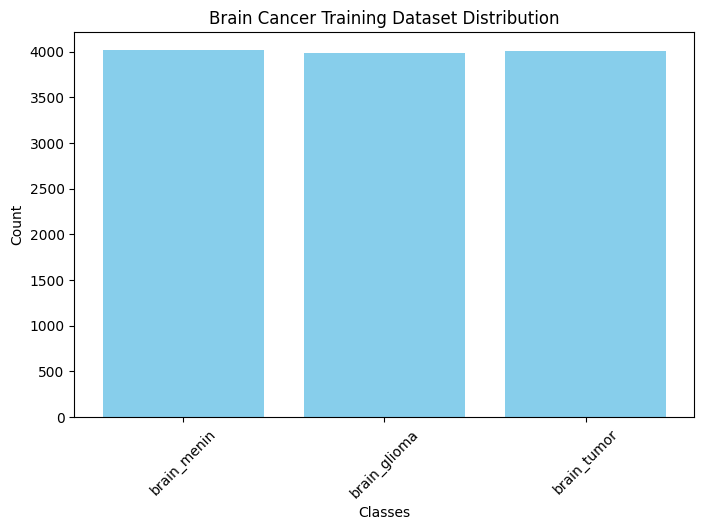

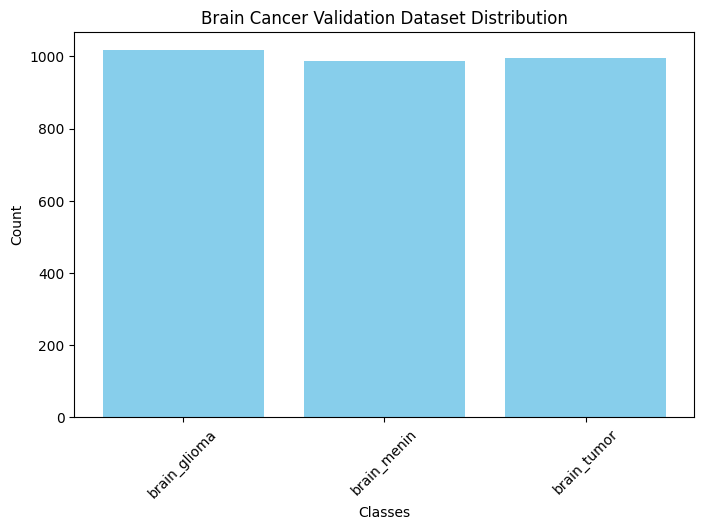

In [40]:
plot_class_distribution(brain_dataset_train, "Brain Cancer Training Dataset Distribution")
plot_class_distribution(brain_dataset_val, "Brain Cancer Validation Dataset Distribution")

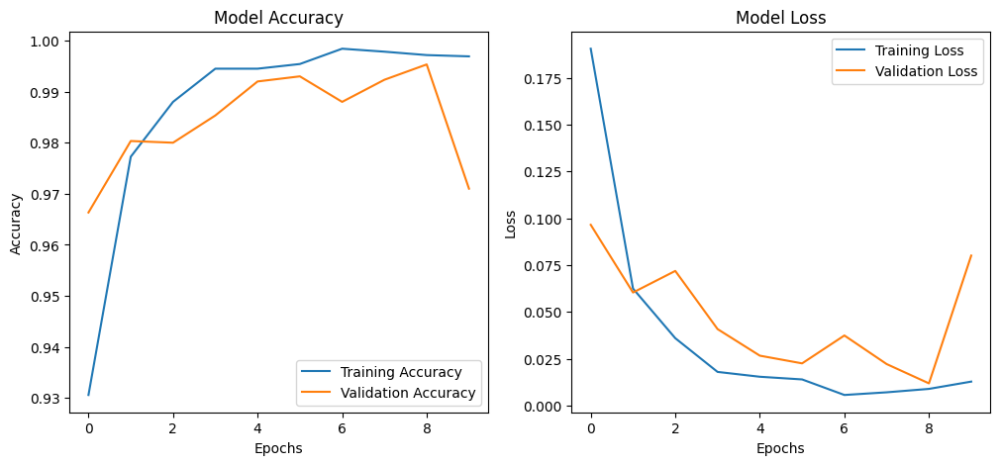

In [41]:

plot_training_history(history)

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━

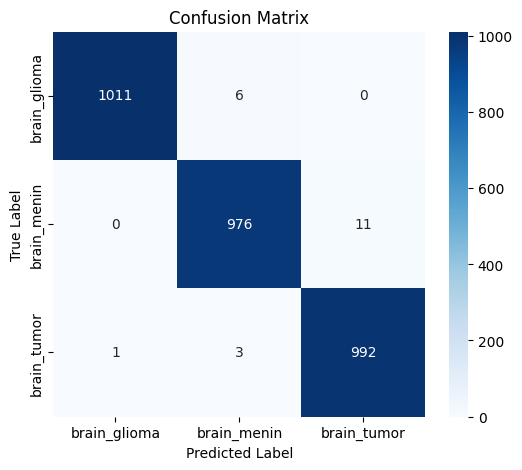

In [42]:

plot_confusion_matrix(model, brain_dataset_val, brain_dataset_val.class_names)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


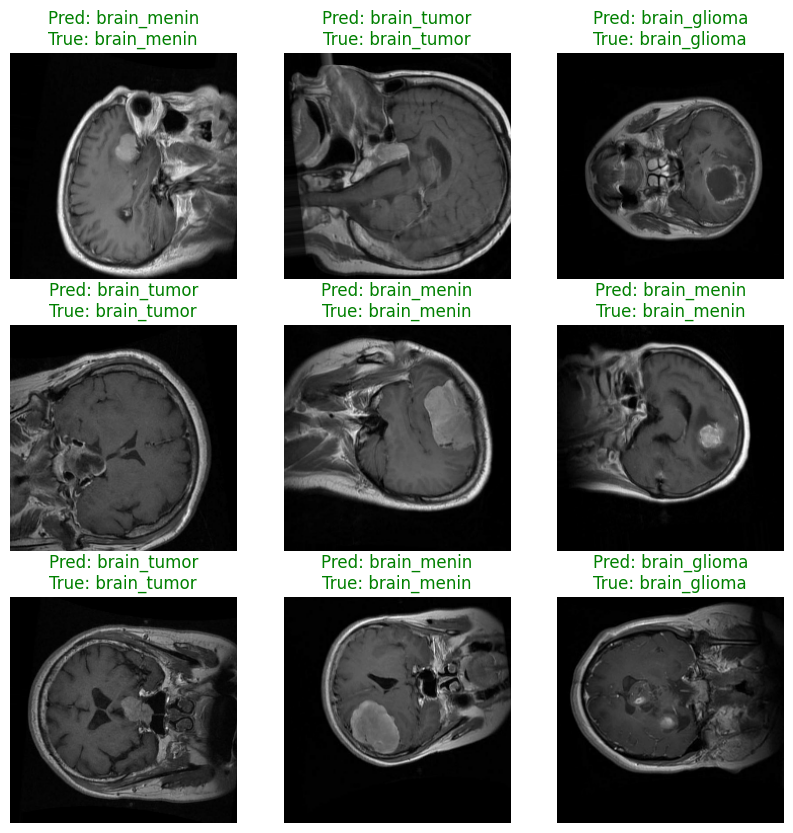

In [43]:
plot_sample_predictions(model, brain_dataset_val, brain_dataset_val.class_names)

# breast Cancer 🔬

Breast Cancer's training dataset
Found 10000 files belonging to 2 classes.
Using 8000 files for training.
Breast Cancer's validation dataset
Found 10000 files belonging to 2 classes.
Using 2000 files for validation.
Epoch 1/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 56s 89ms/step - accuracy: 0.9753 - loss: 0.0845 - val_accuracy: 0.9910 - val_loss: 0.0208
Epoch 2/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step - accuracy: 0.9936 - loss: 0.0170 - val_accuracy: 0.9935 - val_loss: 0.0134
Epoch 3/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step - accuracy: 0.9974 - loss: 0.0071 - val_accuracy: 0.9940 - val_loss: 0.0141
Epoch 4/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - accuracy: 0.9995 - loss: 0.0021 - val_accuracy: 0.9970 - val_loss: 0.0113
Epoch 5/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step - accuracy: 1.0000 - loss: 5.1997e-04 - val_accuracy: 0.9965 - val_loss: 0.0118
Epoch 6/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - accuracy: 1.0000 - loss: 1.2203e-04 - val_accuracy: 0.9965 - val_loss: 0.0

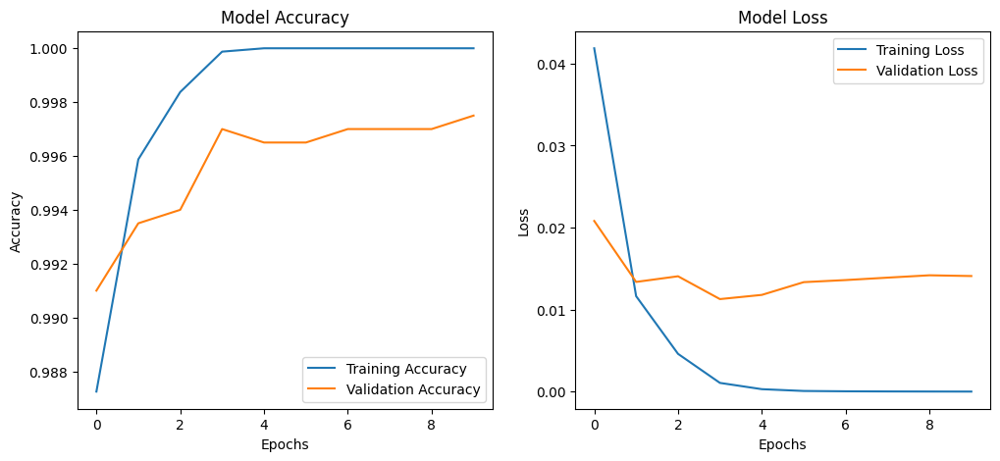

In [44]:
breast_dataset_train = data_loading("Breast Cancer", "training")  
breast_dataset_val = data_loading("Breast Cancer", "validation")

num_classes_breast = 2  

history, model = train_model(breast_dataset_train, breast_dataset_val, num_classes_breast, "breast_cancer")

# Now you can evaluate the model
loss, accuracy = model.evaluate(breast_dataset_val) 
print(f"Evaluation Results - Loss: {loss}, Accuracy: {accuracy}")

# Plot training history
plot_training_history(history)

In [45]:
model.save("/kaggle/working/breast_cancer_model.keras")

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


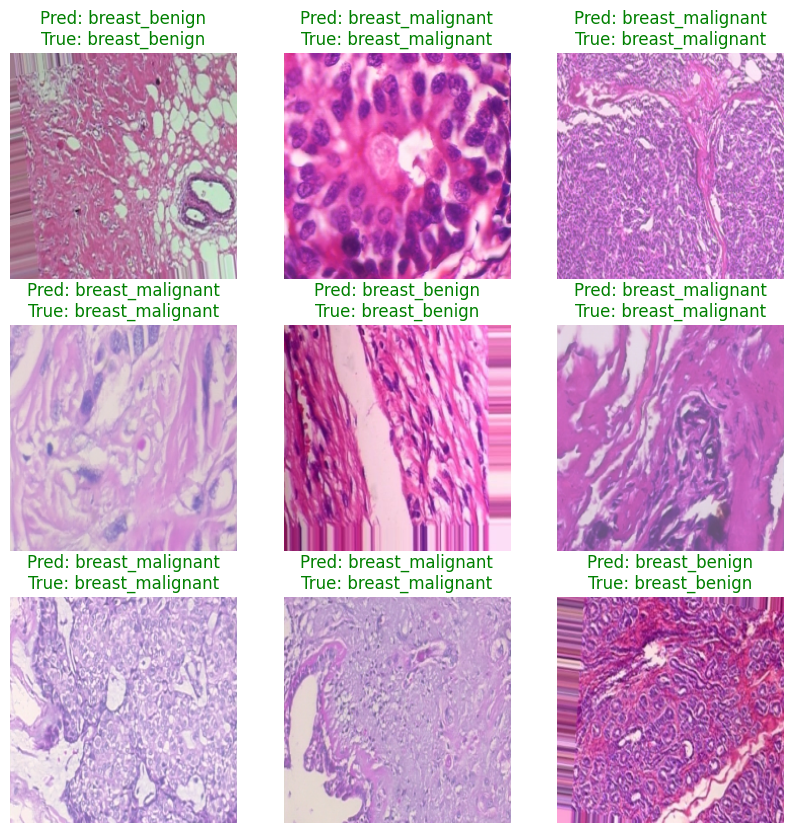

In [46]:
plot_sample_predictions(model, breast_dataset_val, breast_dataset_val.class_names)

# Cervical cancer 🦠

In [47]:
cervical_dataset_train = data_loading("Cervical Cancer", "training")  
cervical_dataset_val = data_loading("Cervical Cancer", "validation")

num_classes_cervical = 5 

history, model = train_model(cervical_dataset_train,cervical_dataset_val, num_classes_cervical, "cervical_cancer")

# Now you can evaluate the model
loss, accuracy = model.evaluate(cervical_dataset_val) 
print(f"Evaluation Results - Loss: {loss}, Accuracy: {accuracy}")


Cervical Cancer's training dataset
Found 25000 files belonging to 5 classes.
Using 20000 files for training.
Cervical Cancer's validation dataset
Found 25000 files belonging to 5 classes.
Using 5000 files for validation.
Epoch 1/10
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 84s 58ms/step - accuracy: 0.8847 - loss: 0.3403 - val_accuracy: 0.9834 - val_loss: 0.0470
Epoch 2/10
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - accuracy: 0.9969 - loss: 0.0157 - val_accuracy: 0.9926 - val_loss: 0.0223
Epoch 3/10
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - accuracy: 0.9985 - loss: 0.0066 - val_accuracy: 0.9968 - val_loss: 0.0129
Epoch 4/10
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - accuracy: 0.9991 - loss: 0.0043 - val_accuracy: 0.9648 - val_loss: 0.1358
Epoch 5/10
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - accuracy: 0.9990 - loss: 0.0062 - val_accuracy: 0.9996 - val_loss: 0.0020
Epoch 6/10
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - accuracy: 1.0000 - loss: 1.2284e-04 - val_accuracy: 0.9996 - 

In [48]:
model.save("/kaggle/working/cervikal_cancer_model.keras")

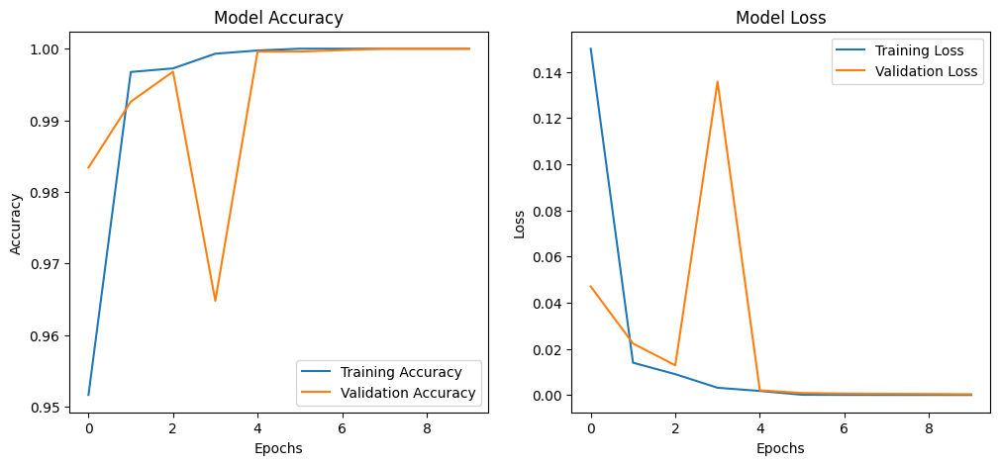

In [49]:
# Plot training history
plot_training_history(history)

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


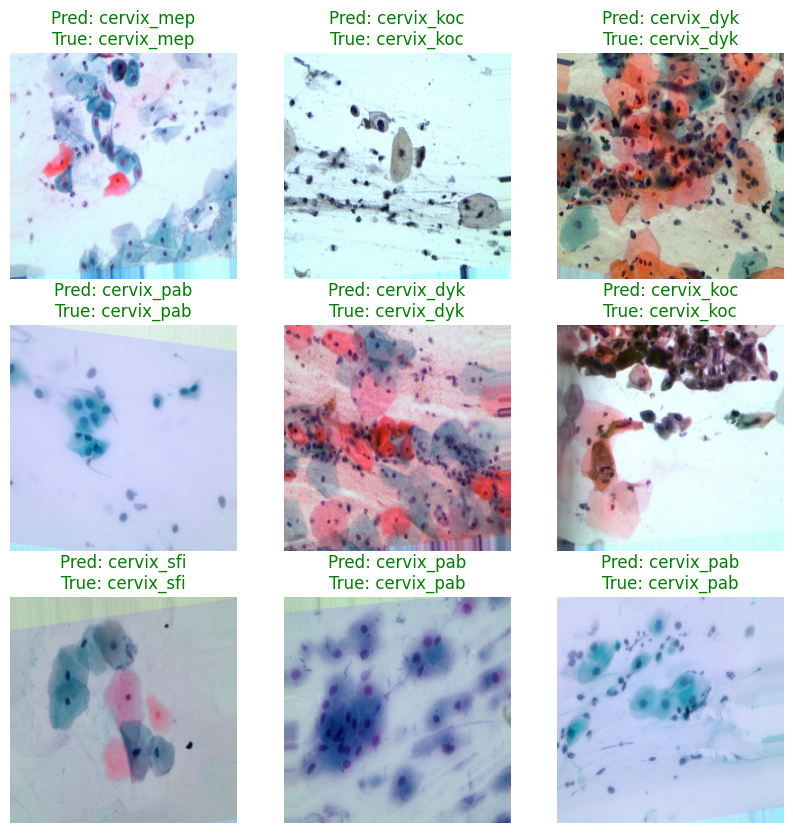

In [50]:
plot_sample_predictions(model, cervical_dataset_val, cervical_dataset_val.class_names)

In [51]:
kidney_dataset_train = data_loading("Kidney Cancer", "training")  
kidney_dataset_val = data_loading("Kidney Cancer", "validation")

num_classes_kidney = 2  

history, model = train_model(kidney_dataset_train, kidney_dataset_val, num_classes_kidney, "kidney_cancer")

# Now you can evaluate the model
loss, accuracy = model.evaluate(kidney_dataset_val) 
print(f"Evaluation Results - Loss: {loss}, Accuracy: {accuracy}")


Kidney Cancer's training dataset
Found 10000 files belonging to 2 classes.
Using 8000 files for training.
Kidney Cancer's validation dataset
Found 10000 files belonging to 2 classes.
Using 2000 files for validation.
Epoch 1/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - accuracy: 0.9436 - loss: 0.1361 - val_accuracy: 0.9985 - val_loss: 0.0061
Epoch 2/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 10s 19ms/step - accuracy: 0.9967 - loss: 0.0087 - val_accuracy: 0.9995 - val_loss: 0.0015
Epoch 3/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - accuracy: 1.0000 - loss: 4.0279e-04 - val_accuracy: 0.9995 - val_loss: 0.0012
Epoch 4/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - accuracy: 1.0000 - loss: 1.8936e-04 - val_accuracy: 1.0000 - val_loss: 6.2758e-04
Epoch 5/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - accuracy: 1.0000 - loss: 8.8380e-05 - val_accuracy: 1.0000 - val_loss: 5.4633e-04
Epoch 6/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - accuracy: 1.0000 - loss: 5.4153e-05 - val_accuracy: 1.0000

In [52]:
model.save("/kaggle/working/kidney_cancer_model.keras")

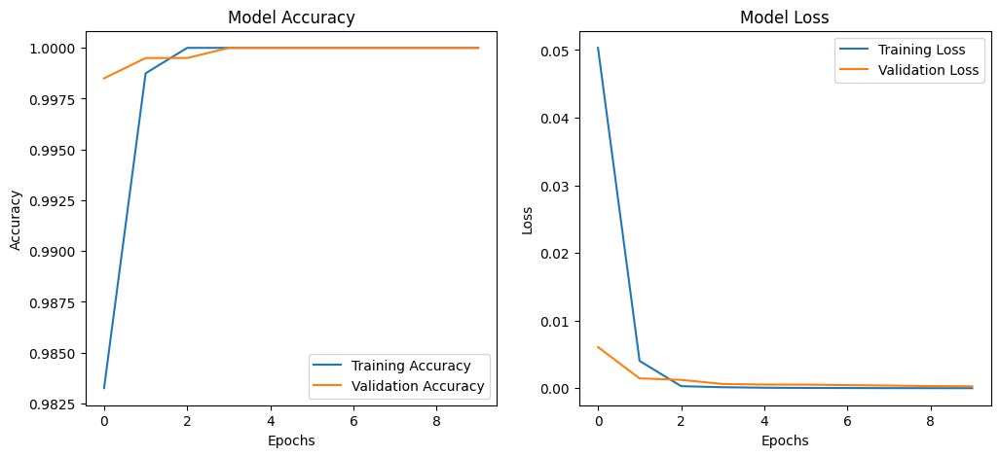

In [53]:
# Plot training history
plot_training_history(history)

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


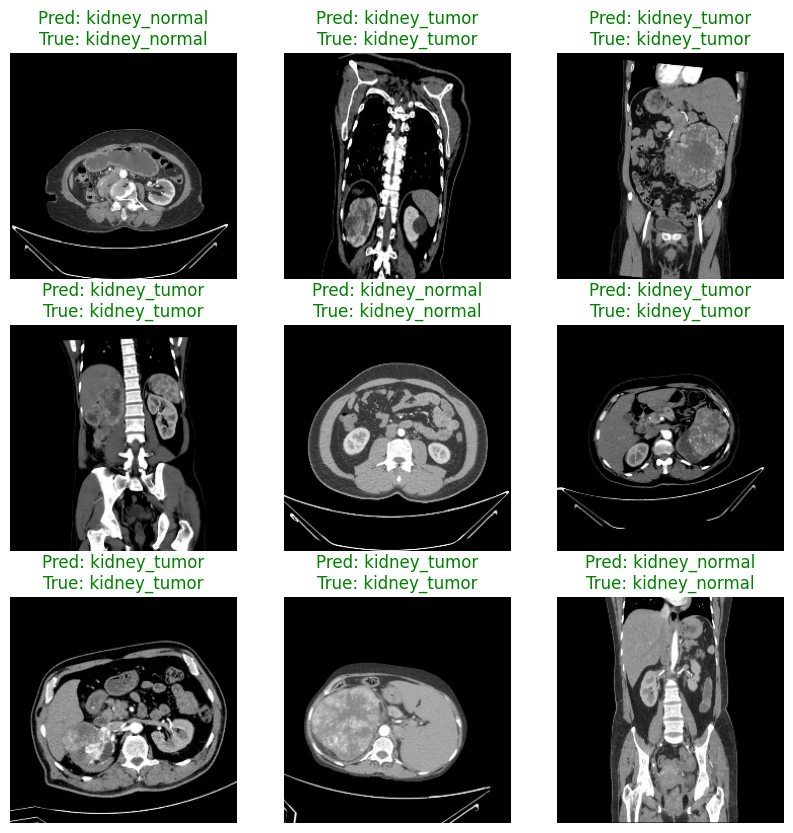

In [54]:
plot_sample_predictions(model, kidney_dataset_val, kidney_dataset_val.class_names)

# Lung and Colon Cancer 🧬

In [55]:
colon_dataset_train = data_loading("Lung and Colon Cancer", "training")
colon_dataset_val = data_loading("Lung and Colon Cancer", "validation")

num_classes_colon = 5 
history, model = train_model(colon_dataset_train, colon_dataset_val, num_classes_colon, "Lung and Colon_cancer")

# Now you can evaluate the model
loss, accuracy = model.evaluate(colon_dataset_val)
print(f"Evaluation Results - Loss: {loss}, Accuracy: {accuracy}")


Lung and Colon Cancer's training dataset
Found 25000 files belonging to 5 classes.
Using 20000 files for training.
Lung and Colon Cancer's validation dataset
Found 25000 files belonging to 5 classes.
Using 5000 files for validation.
Epoch 1/10
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 91s 65ms/step - accuracy: 0.9469 - loss: 0.1743 - val_accuracy: 0.9906 - val_loss: 0.0269
Epoch 2/10
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - accuracy: 0.9942 - loss: 0.0178 - val_accuracy: 0.9936 - val_loss: 0.0197
Epoch 3/10
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - accuracy: 0.9963 - loss: 0.0109 - val_accuracy: 0.9962 - val_loss: 0.0111
Epoch 4/10
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - accuracy: 0.9985 - loss: 0.0047 - val_accuracy: 0.9964 - val_loss: 0.0113
Epoch 5/10
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.9980 - val_loss: 0.0064
Epoch 6/10
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0

In [56]:
model.save("/kaggle/working/colon_cancer_model.keras")

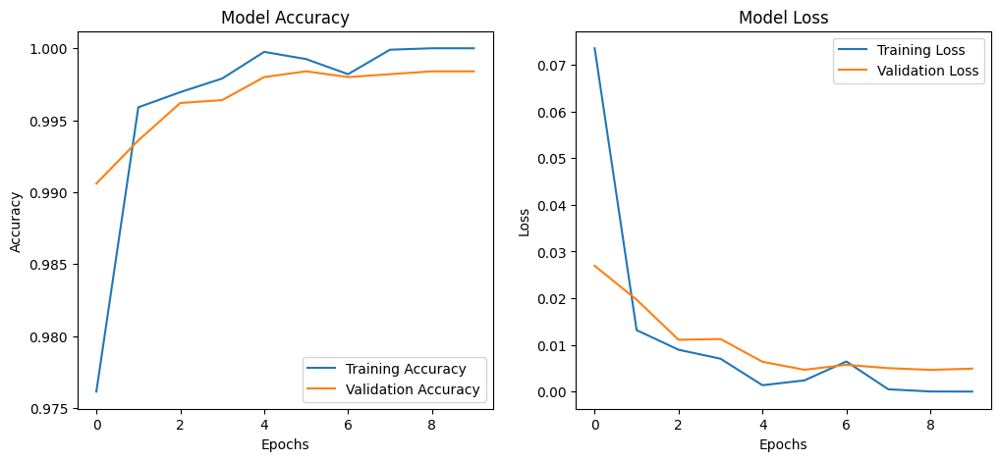

In [57]:
# Plot training history
plot_training_history(history)

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


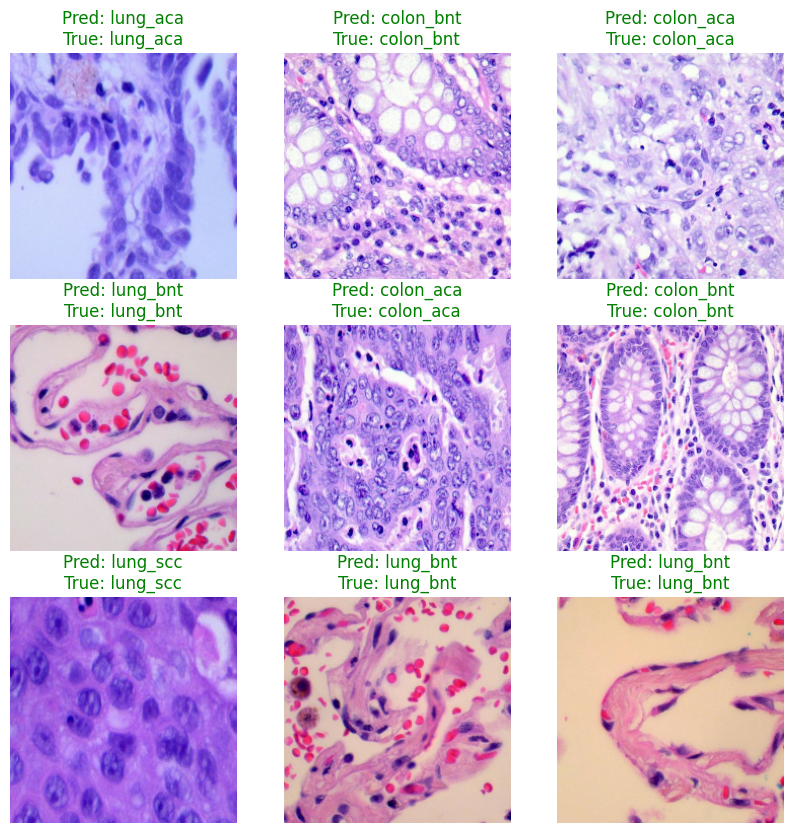

In [58]:
plot_sample_predictions(model, colon_dataset_val, colon_dataset_val.class_names)

# Lymphoma 💊

In [59]:
lymphoma_dataset_train = data_loading("Lymphoma", "training")
lymphoma_dataset_val = data_loading("Lymphoma", "validation")

num_classes_lymphoma = 3 
history, model = train_model(lymphoma_dataset_train, lymphoma_dataset_val, num_classes_lymphoma, "Lymphoma")

# Now you can evaluate the model
loss, accuracy = model.evaluate(lymphoma_dataset_val)
print(f"Evaluation Results - Loss: {loss}, Accuracy: {accuracy}")


Lymphoma's training dataset
Found 15000 files belonging to 3 classes.
Using 12000 files for training.
Lymphoma's validation dataset
Found 15000 files belonging to 3 classes.
Using 3000 files for validation.
Epoch 1/10
750/750 ━━━━━━━━━━━━━━━━━━━━ 62s 68ms/step - accuracy: 0.7107 - loss: 0.6546 - val_accuracy: 0.8567 - val_loss: 0.3445
Epoch 2/10
750/750 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - accuracy: 0.9279 - loss: 0.2034 - val_accuracy: 0.9497 - val_loss: 0.1365
Epoch 3/10
750/750 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - accuracy: 0.9640 - loss: 0.1070 - val_accuracy: 0.9687 - val_loss: 0.0879
Epoch 4/10
750/750 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - accuracy: 0.9850 - loss: 0.0528 - val_accuracy: 0.9757 - val_loss: 0.0704
Epoch 5/10
750/750 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step - accuracy: 0.9902 - loss: 0.0345 - val_accuracy: 0.9697 - val_loss: 0.0830
Epoch 6/10
750/750 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - accuracy: 0.9930 - loss: 0.0242 - val_accuracy: 0.9760 - val_loss: 0.0667
Epoch 7/10
75

In [60]:
model.save("/kaggle/working/lymphoma_cancer_model.keras")

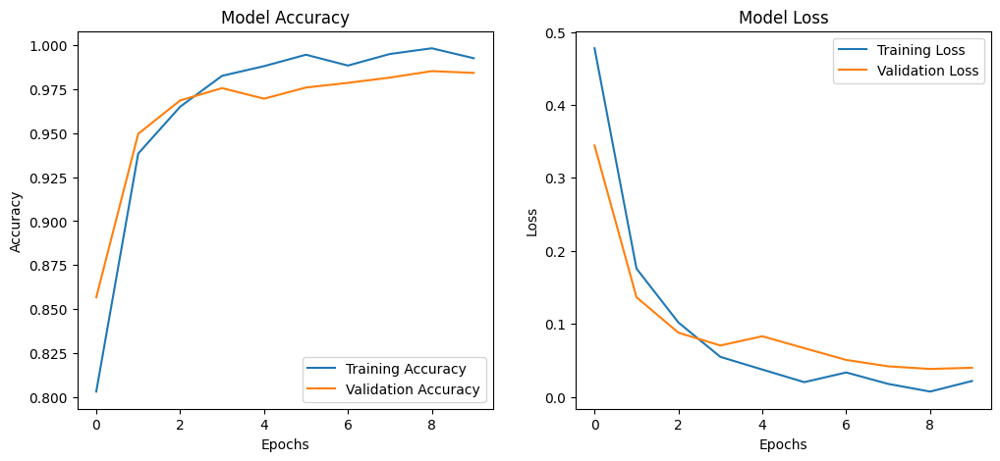

In [61]:
# Plot training history
plot_training_history(history)

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


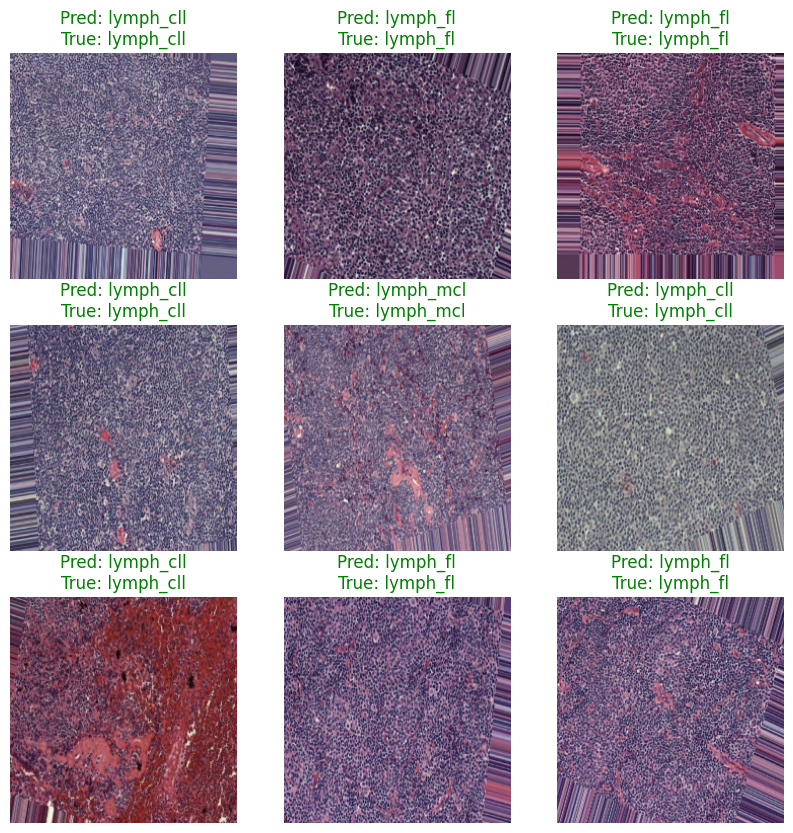

In [62]:
plot_sample_predictions(model, lymphoma_dataset_val, lymphoma_dataset_val.class_names)

# Oral cancer 🧫

In [63]:
oral_dataset_train = data_loading("Oral Cancer", "training")
oral_dataset_val = data_loading("Oral Cancer", "validation")

num_classes_oral = 2
history, model = train_model_oral(oral_dataset_train, oral_dataset_val, num_classes_oral, "Oral_cancer")

# Now you can evaluate the model
loss, accuracy = model.evaluate(oral_dataset_val)
print(f"Evaluation Results - Loss: {loss}, Accuracy: {accuracy}")


Oral Cancer's training dataset
Found 10002 files belonging to 2 classes.
Using 8002 files for training.
Oral Cancer's validation dataset
Found 10002 files belonging to 2 classes.
Using 2000 files for validation.
Epoch 1/15
501/501 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - accuracy: 0.7909 - loss: 0.4343 - val_accuracy: 0.8955 - val_loss: 0.2668
Epoch 2/15
501/501 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - accuracy: 0.9218 - loss: 0.1916 - val_accuracy: 0.9070 - val_loss: 0.2195
Epoch 3/15
501/501 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - accuracy: 0.9587 - loss: 0.1170 - val_accuracy: 0.9335 - val_loss: 0.1745
Epoch 4/15
501/501 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.9791 - loss: 0.0618 - val_accuracy: 0.9425 - val_loss: 0.1630
Epoch 5/15
501/501 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - accuracy: 0.9920 - loss: 0.0316 - val_accuracy: 0.9365 - val_loss: 0.1898
Epoch 6/15
501/501 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.9942 - loss: 0.0211 - val_accuracy: 0.9470 - val_loss: 0.1732
Epoch 7/

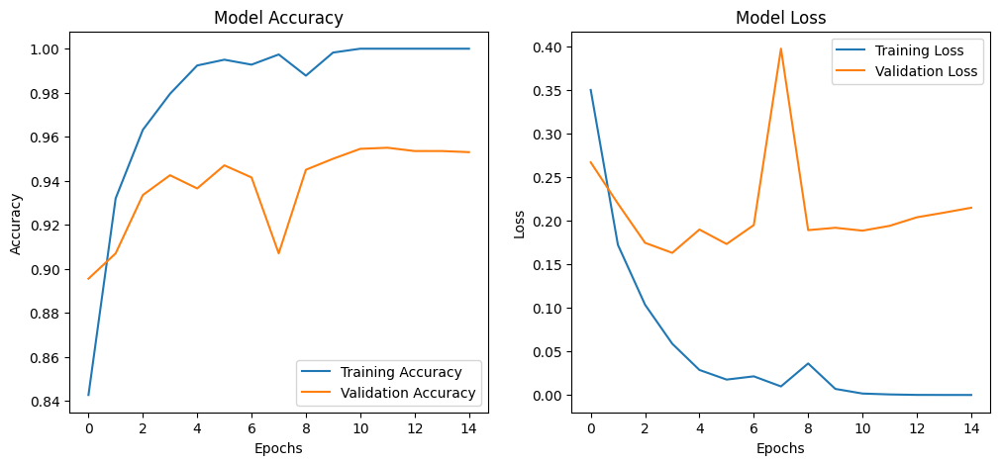

In [64]:
# Plot training history
plot_training_history(history)

In [65]:
import tensorflow as tf
from tensorflow.keras.layers import RandomFlip, RandomRotation, RandomZoom, RandomHeight, RandomWidth

# Define image augmentation layers
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomContrast(0.1)
])

callbacks = [
    tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3),
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
]


# Modify the data_loading function to include augmentation for training data
def data_loading(types, subset):
    print(f"{types}'s {subset} dataset")
    directory1 = directory + "/" + types
    dataset = tf.keras.preprocessing.image_dataset_from_directory(
        directory1,
        labels="inferred",
        label_mode="categorical",
        validation_split=0.2,
        subset=subset,
        shuffle=True,
        seed=123,
        batch_size=8,
        image_size=SIZE,
    )

    if subset == "training":
        # Apply data augmentation only on training data
        dataset = dataset.map(lambda x, y: (data_augmentation(x, training=True), y))
    
    return dataset

# Load datasets with augmentation for training and standard for validation
oral_dataset_train = data_loading("Oral Cancer", "training")
oral_dataset_val = data_loading("Oral Cancer", "validation")


Oral Cancer's training dataset
Found 10002 files belonging to 2 classes.
Using 8002 files for training.
Oral Cancer's validation dataset
Found 10002 files belonging to 2 classes.
Using 2000 files for validation.


In [66]:
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping

def train_model_oral_2(train_data, val_data, num_classes, model_name):
    model = create_model(num_classes)

    callbacks = [
        ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, verbose=1),
        EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1)
    ]

    history = model.fit(
        train_data,
        validation_data=val_data,
        epochs=15,
        callbacks=callbacks
    )

    model.save(f"{model_name}_model.h5")
    return history, model

In [67]:
num_classes_oral = 2  # Update this to match the number of classes in your Oral Cancer dataset

# Train the model
history, model = train_model_oral_2(oral_dataset_train, oral_dataset_val, num_classes_oral, "Oral_cancer")

# Evaluate the model on the validation data
loss, accuracy = model.evaluate(oral_dataset_val)
print(f"Evaluation Results - Loss: {loss}, Accuracy: {accuracy}")


Epoch 1/15
1001/1001 ━━━━━━━━━━━━━━━━━━━━ 80s 70ms/step - accuracy: 0.7829 - loss: 0.4479 - val_accuracy: 0.8695 - val_loss: 0.2957 - learning_rate: 1.0000e-04
Epoch 2/15
1001/1001 ━━━━━━━━━━━━━━━━━━━━ 63s 63ms/step - accuracy: 0.8842 - loss: 0.2656 - val_accuracy: 0.8985 - val_loss: 0.2381 - learning_rate: 1.0000e-04
Epoch 3/15
1001/1001 ━━━━━━━━━━━━━━━━━━━━ 63s 63ms/step - accuracy: 0.9191 - loss: 0.2043 - val_accuracy: 0.9040 - val_loss: 0.2296 - learning_rate: 1.0000e-04
Epoch 4/15
1001/1001 ━━━━━━━━━━━━━━━━━━━━ 62s 62ms/step - accuracy: 0.9364 - loss: 0.1601 - val_accuracy: 0.8800 - val_loss: 0.3156 - learning_rate: 1.0000e-04
Epoch 5/15
1001/1001 ━━━━━━━━━━━━━━━━━━━━ 63s 63ms/step - accuracy: 0.9529 - loss: 0.1188 - val_accuracy: 0.9170 - val_loss: 0.2249 - learning_rate: 1.0000e-04
Epoch 6/15
1001/1001 ━━━━━━━━━━━━━━━━━━━━ 63s 63ms/step - accuracy: 0.9572 - loss: 0.1057 - val_accuracy: 0.9395 - val_loss: 0.1460 - learning_rate: 1.0000e-04
Epoch 7/15
1001/1001 ━━━━━━━━━━━━━━━━━━━

In [68]:
model.save("/kaggle/working/oral_cancer_model.keras")

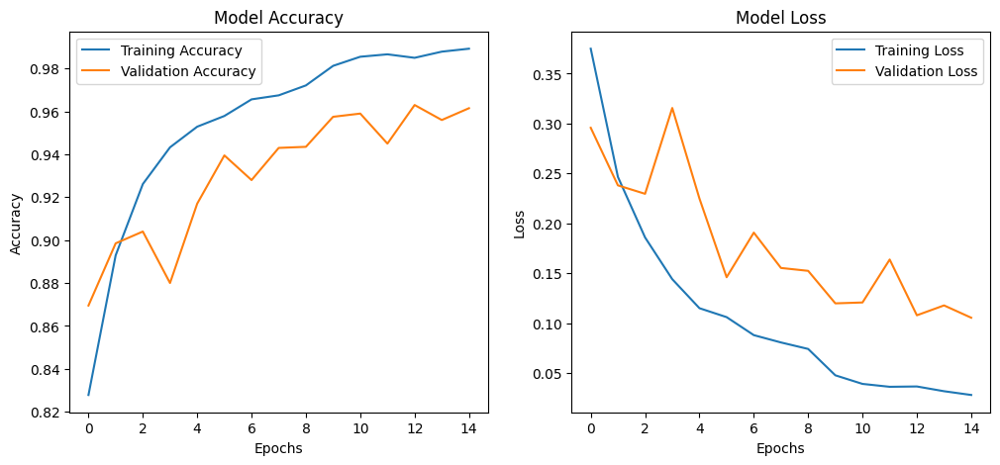

In [69]:
# Plot training history
plot_training_history(history)

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


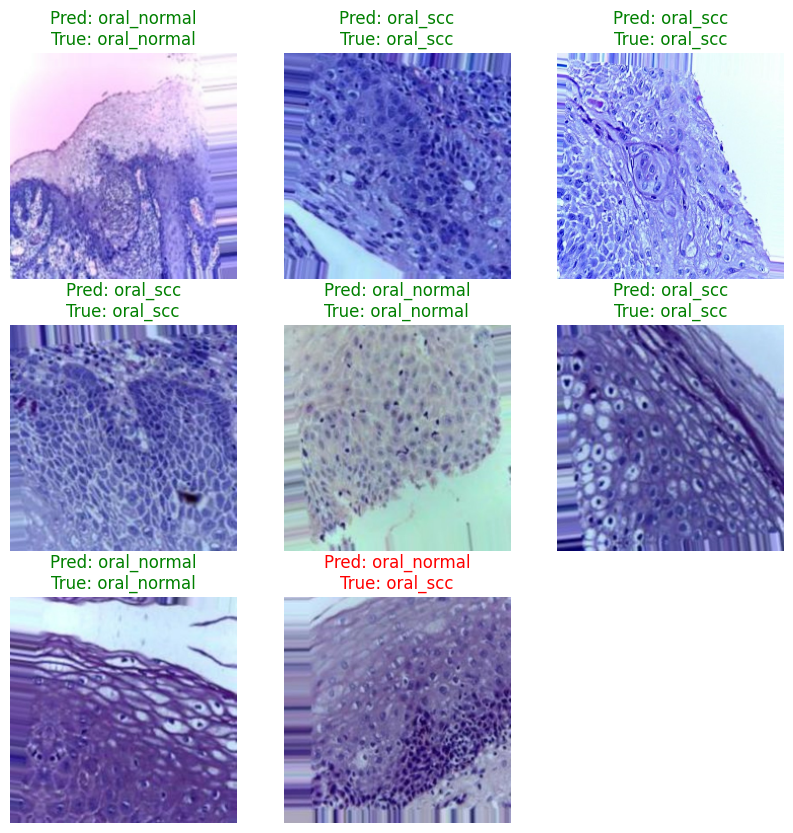

In [70]:
plot_sample_predictions(model, oral_dataset_val, oral_dataset_val.class_names)

# Accuracy comparison between cancers

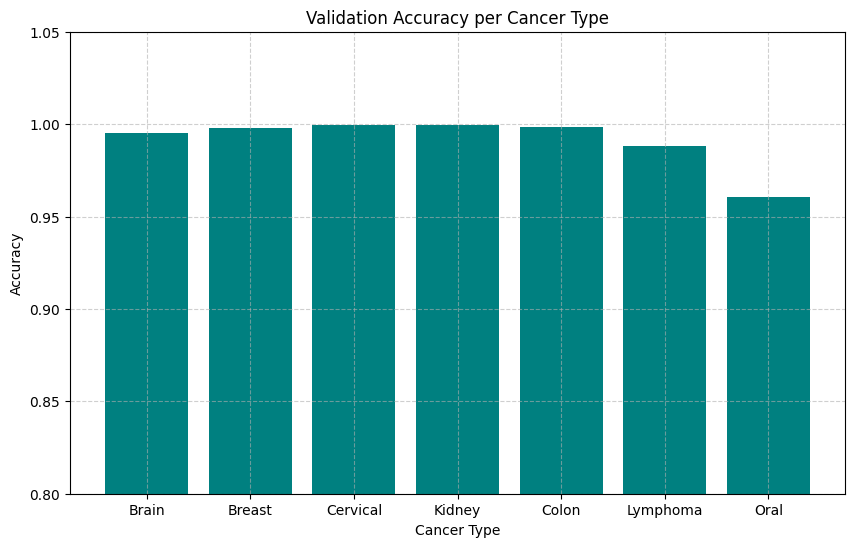

In [71]:
import matplotlib.pyplot as plt

cancer_types = ['Brain', 'Breast', 'Cervical', 'Kidney', 'Colon', 'Lymphoma', 'Oral']
accuracies = [ 0.9950, 0.9980,  0.9994, 0.9994, 0.9986, 0.9879, 0.9605]  

plt.figure(figsize=(10, 6))
plt.bar(cancer_types, accuracies, color='teal')
plt.ylim(0.8, 1.05)
plt.title("Validation Accuracy per Cancer Type")
plt.ylabel("Accuracy")
plt.xlabel("Cancer Type")
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

# Grad-CAM: Highlighting Key Image Regions for cancer classifications

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


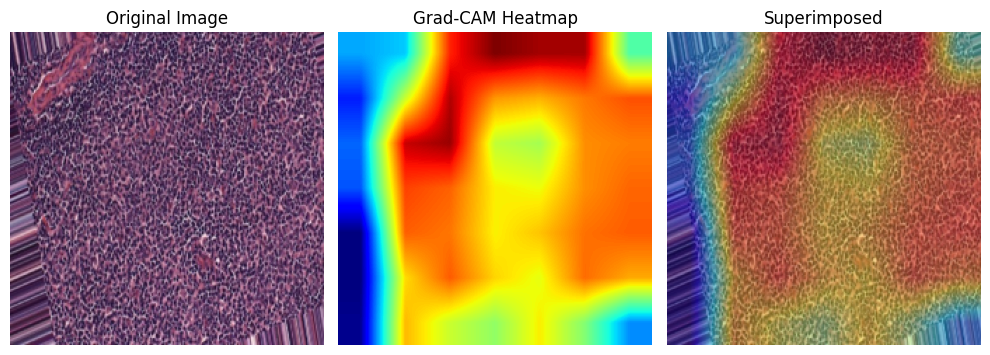

In [72]:
# Get a batch from your validation dataset
image_batch, label_batch = next(iter(lymphoma_dataset_val))
image = image_batch[0]
label = label_batch[0]

# Add batch dimension
image_input = tf.expand_dims(image, axis=0)

# Predict the class
preds = model.predict(image_input)
predicted_class = tf.argmax(preds[0])

# Run Grad-CAM for the predicted class
generate_gradcam_heatmap(model, image_input, class_index=predicted_class)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


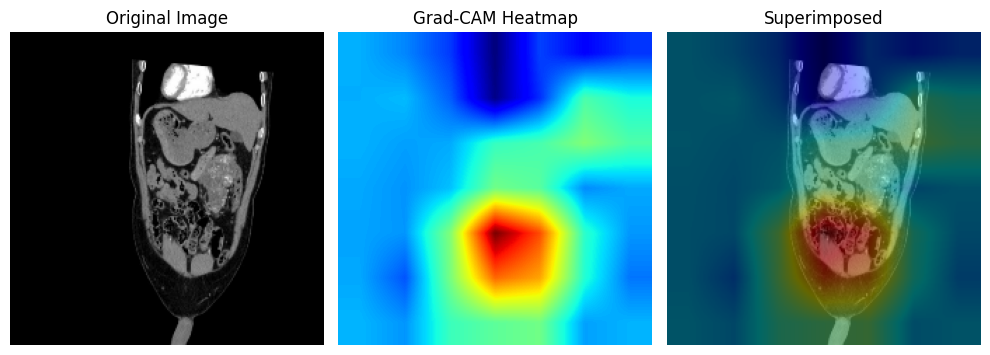

In [73]:
# Get a batch from your validation dataset
image_batch, label_batch = next(iter(kidney_dataset_val))
image = image_batch[0]
label = label_batch[0]

# Add batch dimension
image_input = tf.expand_dims(image, axis=0)

# Predict the class
preds = model.predict(image_input)
predicted_class = tf.argmax(preds[0])

# Run Grad-CAM for the predicted class
generate_gradcam_heatmap(model, image_input, class_index=predicted_class)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


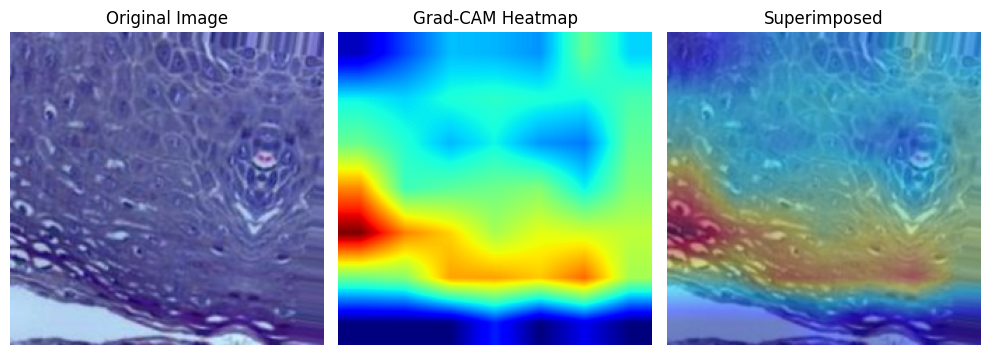

In [74]:
# Get a batch from your validation dataset
image_batch, label_batch = next(iter(oral_dataset_val))
image = image_batch[0]
label = label_batch[0]

# Add batch dimension
image_input = tf.expand_dims(image, axis=0)

# Predict the class
preds = model.predict(image_input)
predicted_class = tf.argmax(preds[0])

# Run Grad-CAM for the predicted class
generate_gradcam_heatmap(model, image_input, class_index=predicted_class)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


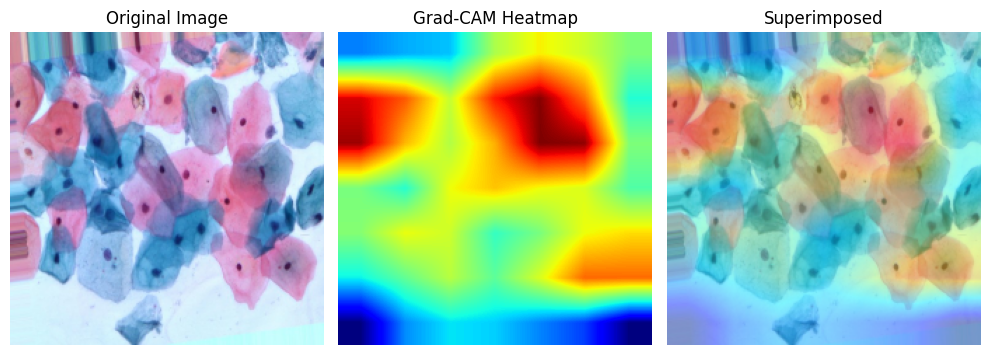

In [75]:
# Get a batch from your validation dataset
image_batch, label_batch = next(iter(cervical_dataset_val))
image = image_batch[0]
label = label_batch[0]

# Add batch dimension
image_input = tf.expand_dims(image, axis=0)

# Predict the class
preds = model.predict(image_input)
predicted_class = tf.argmax(preds[0])

# Run Grad-CAM for the predicted class
generate_gradcam_heatmap(model, image_input, class_index=predicted_class)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


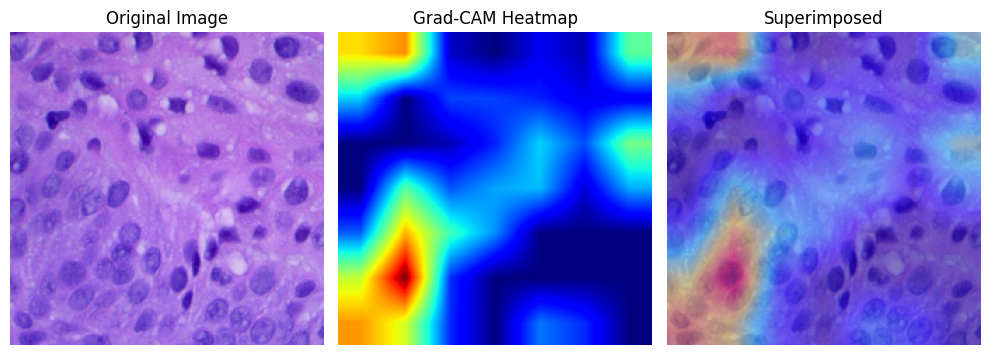

In [76]:
# Get a batch from your validation dataset
image_batch, label_batch = next(iter(colon_dataset_val))
image = image_batch[0]
label = label_batch[0]

# Add batch dimension
image_input = tf.expand_dims(image, axis=0)

# Predict the class
preds = model.predict(image_input)
predicted_class = tf.argmax(preds[0])

# Run Grad-CAM for the predicted class
generate_gradcam_heatmap(model, image_input, class_index=predicted_class)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


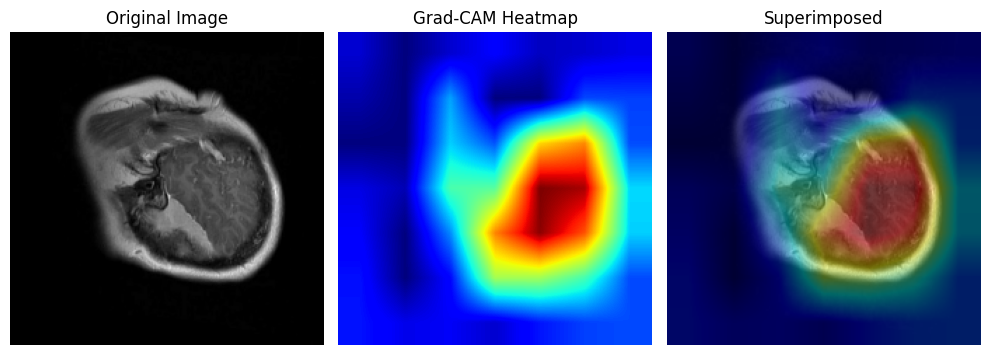

In [77]:
# Get a batch from your validation dataset
image_batch, label_batch = next(iter(brain_dataset_val))
image = image_batch[0]
label = label_batch[0]

# Add batch dimension
image_input = tf.expand_dims(image, axis=0)

# Predict the class
preds = model.predict(image_input)
predicted_class = tf.argmax(preds[0])

# Run Grad-CAM for the predicted class
generate_gradcam_heatmap(model, image_input, class_index=predicted_class)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


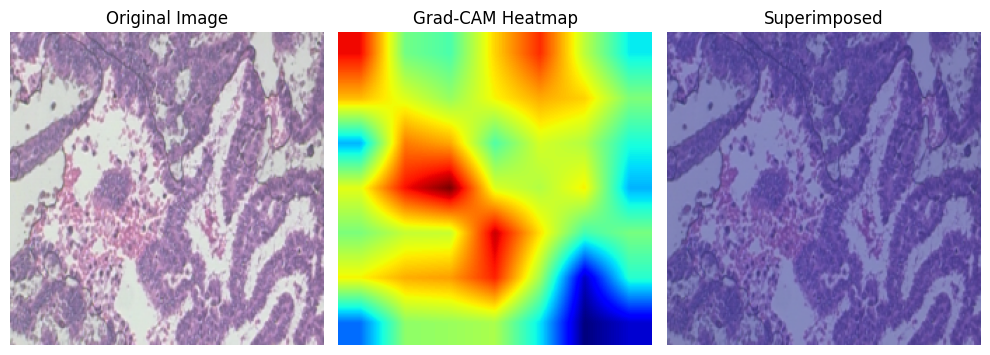

In [78]:
# Get a batch from your validation dataset
image_batch, label_batch = next(iter(breast_dataset_val))
image = image_batch[0]
label = label_batch[0]

# Add batch dimension
image_input = tf.expand_dims(image, axis=0)

# Predict the class
preds = model.predict(image_input)
predicted_class = tf.argmax(preds[0])

# Run Grad-CAM for the predicted class
generate_gradcam_heatmap(model, image_input, class_index=predicted_class)


# main dataset (including all cancer types)

In [79]:
num_classes_main = 7  # Update this to match the number of classes in your Oral Cancer dataset

# Train the model
history, model = train_model(main_dataset_train, main_dataset_val, num_classes_main, "")

# Evaluate the model on the validation data
loss, accuracy = model.evaluate(main_dataset_val)
print(f"Evaluation Results - Loss: {loss}, Accuracy: {accuracy}")


Epoch 1/10
5501/5501 ━━━━━━━━━━━━━━━━━━━━ 164s 28ms/step - accuracy: 0.9862 - loss: 0.0474 - val_accuracy: 0.9995 - val_loss: 0.0017
Epoch 2/10
5501/5501 ━━━━━━━━━━━━━━━━━━━━ 133s 24ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.9995 - val_loss: 0.0016
Epoch 3/10
5501/5501 ━━━━━━━━━━━━━━━━━━━━ 133s 24ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.9998 - val_loss: 8.7301e-04
Epoch 4/10
5501/5501 ━━━━━━━━━━━━━━━━━━━━ 133s 24ms/step - accuracy: 0.9997 - loss: 9.1222e-04 - val_accuracy: 0.9993 - val_loss: 0.0026
Epoch 5/10
5501/5501 ━━━━━━━━━━━━━━━━━━━━ 132s 24ms/step - accuracy: 0.9997 - loss: 0.0014 - val_accuracy: 0.9998 - val_loss: 0.0014
Epoch 6/10
5501/5501 ━━━━━━━━━━━━━━━━━━━━ 147s 27ms/step - accuracy: 0.9996 - loss: 9.9584e-04 - val_accuracy: 0.9997 - val_loss: 0.0013
Epoch 7/10
5501/5501 ━━━━━━━━━━━━━━━━━━━━ 132s 24ms/step - accuracy: 1.0000 - loss: 6.0868e-06 - val_accuracy: 0.9999 - val_loss: 0.0012
Epoch 8/10
5501/5501 ━━━━━━━━━━━━━━━━━━━━ 132s 24ms/s

In [80]:
model.save("/kaggle/working/main_cancer_model.keras")

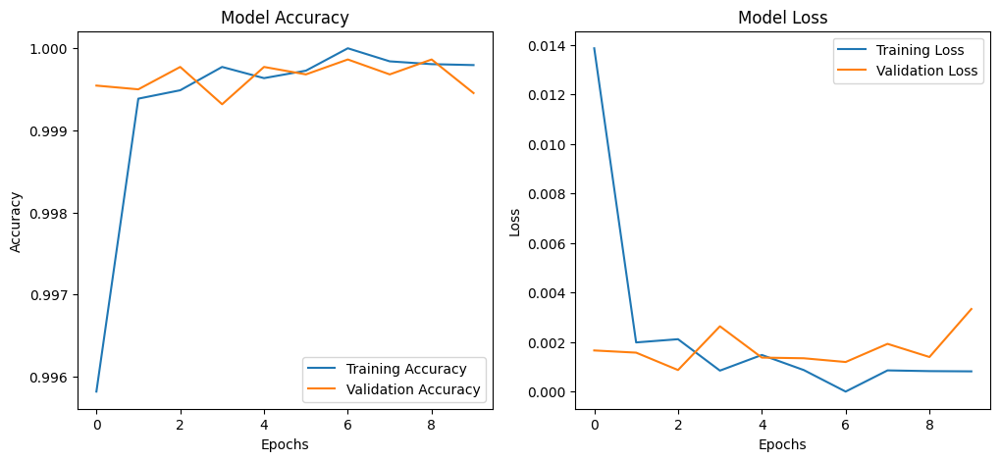

In [81]:
# Plot training history
plot_training_history(history)

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


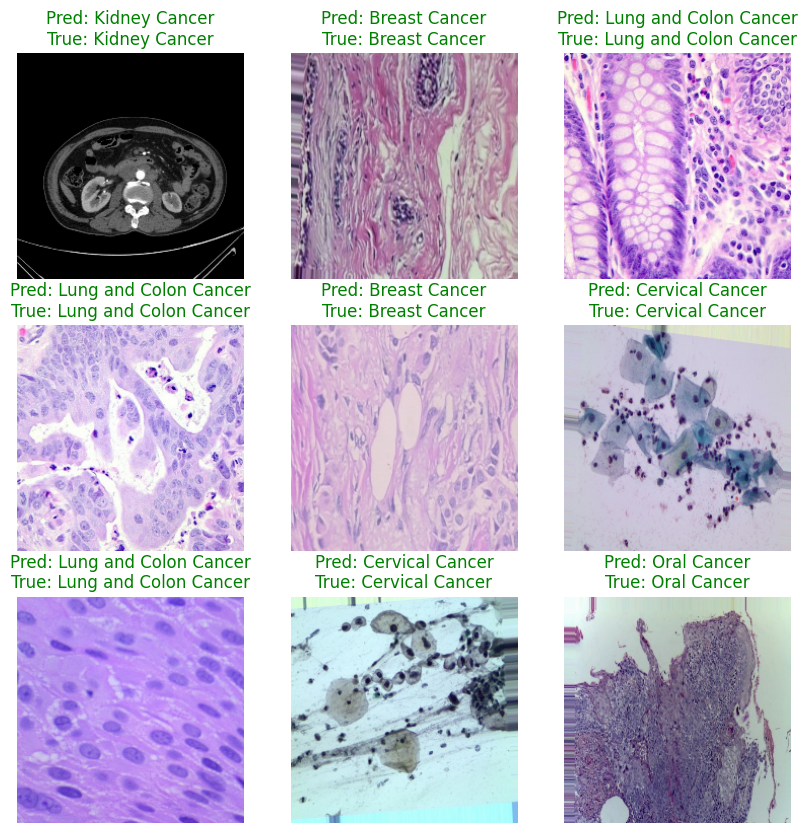

In [82]:
plot_sample_predictions(model, main_dataset_val, main_dataset_val.class_names)

# 🔬 1. Model Generalization Test
* # Can a model trained on brain cancer data can classify others like oral or kidney ?

In [83]:
model = tf.keras.models.load_model("/kaggle/input/brain/keras/default/1/brain_cancer_model.keras")


/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:713: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 10 variables whereas the saved optimizer has 18 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [84]:
import numpy as np

y_true = []
y_pred = []

for images, labels in kidney_dataset_val:
    preds = model.predict(images)
    y_pred.extend(np.argmax(preds, axis=1))
    y_true.extend(np.argmax(labels.numpy(), axis=1))

y_true = np.array(y_true)
y_pred = np.array(y_pred)

# Compute accuracy
accuracy = np.mean(y_true == y_pred)
print(f"Brain model on Kidney data — Accuracy: {accuracy:.4f}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━

In [85]:
model = tf.keras.models.load_model("/kaggle/input/cervical/keras/default/1/cervikal_cancer_model.keras")

In [ ]:
import numpy as np

y_true = []
y_pred = []

for images, labels in colon_dataset_val:
    preds = model.predict(images)
    y_pred.extend(np.argmax(preds, axis=1))
    y_true.extend(np.argmax(labels.numpy(), axis=1))

y_true = np.array(y_true)
y_pred = np.array(y_pred)

# Compute accuracy
accuracy = np.mean(y_true == y_pred)
print(f"colon model on cervical data — Accuracy: {accuracy:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━

In [ ]:
model = tf.keras.models.load_model("/kaggle/input/breast/keras/default/1/breast_cancer_model.keras")

In [ ]:
import numpy as np

y_true = []
y_pred = []

for images, labels in kidney_dataset_val:
    preds = model.predict(images)
    y_pred.extend(np.argmax(preds, axis=1))
    y_true.extend(np.argmax(labels.numpy(), axis=1))

y_true = np.array(y_true)
y_pred = np.array(y_pred)

# Compute accuracy
accuracy = np.mean(y_true == y_pred)
print(f"breast model on Kidney data — Accuracy: {accuracy:.4f}")


In [ ]:
model = tf.keras.models.load_model("/kaggle/input/oral/keras/default/1/oral_cancer_model.keras")

In [ ]:
import numpy as np

y_true = []
y_pred = []

for images, labels in lymphoma_dataset_val:
    preds = model.predict(images)
    y_pred.extend(np.argmax(preds, axis=1))
    y_true.extend(np.argmax(labels.numpy(), axis=1))

y_true = np.array(y_true)
y_pred = np.array(y_pred)

# Compute accuracy
accuracy = np.mean(y_true == y_pred)
print(f"oral model on lymphoma data — Accuracy: {accuracy:.4f}")


# Showing misclassifications in main model

In [ ]:
model = tf.keras.models.load_model("/kaggle/input/main_model/keras/default/1/main_cancer_model (1).keras")


In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt

def visualize_misclassified_samples(model, dataset, class_names, max_samples=5):
    misclassified_images = []
    misclassified_preds = []
    misclassified_labels = []

    # Collect misclassified samples
    for images, labels in dataset:
        preds = model.predict(images)
        pred_classes = tf.argmax(preds, axis=1)
        true_classes = tf.argmax(labels, axis=1)

        for i in range(len(images)):
            if pred_classes[i] != true_classes[i]:
                misclassified_images.append(images[i].numpy())
                misclassified_preds.append(pred_classes[i].numpy())
                misclassified_labels.append(true_classes[i].numpy())

            if len(misclassified_images) >= max_samples:
                break
        if len(misclassified_images) >= max_samples:
            break

    # Display using Grad-CAM
    for i in range(len(misclassified_images)):
        img = tf.expand_dims(misclassified_images[i], axis=0)
        pred_idx = misclassified_preds[i]
        true_idx = misclassified_labels[i]
        print(f"❌ Misclassified Sample {i+1} — True: {class_names[true_idx]}, Predicted: {class_names[pred_idx]}")
        generate_gradcam_heatmap(model, img, class_index=pred_idx)


In [ ]:
visualize_misclassified_samples(model, main_dataset_val, main_dataset_val.class_names, max_samples=5)
